In [142]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from pandas_profiling import ProfileReport
import pandas_profiling
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering
from yellowbrick.features import PCA
from mpl_toolkits.mplot3d import Axes3D

# Pandas Profilling

In [2]:
df_young = pd.read_csv('./data/asset-v1_IRONHACK+DAFT+202002_SAO+type@asset+block@responses.csv')

In [3]:
profile = ProfileReport(df_young, title='Pandas Profiling Report',minimal=True)

In [4]:
profile.to_file(output_file='./profile_young.html')

# Import and Describe the Dataset

In [5]:
df_young = pd.read_csv('./data/asset-v1_IRONHACK+DAFT+202002_SAO+type@asset+block@responses.csv')

In [6]:
#aumentando o número de linhas para visualização dos dados
pd.options.display.max_rows = 999

## Entendendo as dimensões do dataset

In [7]:
df_young.shape

(1010, 150)

In [8]:
df_young.head(5).T

,0,1,2,3,4
Music,5,4,5,5,5
Slow songs or fast songs,3,4,5,3,3
Dance,2,2,2,2,4
Folk,1,1,2,1,3
Country,2,1,3,1,2
Classical music,2,1,4,1,4
Musical,1,2,5,1,3
Pop,5,3,3,2,5
Rock,5,5,5,2,3
Metal or Hardrock,1,4,3,1,1


Conclusão: 

Olhando o df_young.head() consigo visualizar que temos algumas colunas categóricas e maioria numérica. Dentre as numéricas percebo que temos a maioria sendo pontuação de 1 a 5 e algumas com valores diferentes referente alguma característica do indivíduo da linha. 

In [9]:
df_young.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1010 entries, 0 to 1009
Columns: 150 entries, Music to House - block of flats
dtypes: float64(134), int64(5), object(11)
memory usage: 1.2+ MB


Conclusão: 

Podemos ver com mais detalhe que a distribuição de dados está: 
dtypes: float64(134), int64(5), object(11)

In [10]:
df_young.describe().T

,count,mean,std,min,25%,50%,75%,max
Music,1007.0,4.731877,0.664049,1.0,5.0,5.0,5.0,5.0
Slow songs or fast songs,1008.0,3.328373,0.833931,1.0,3.0,3.0,4.0,5.0
Dance,1006.0,3.113320,1.170568,1.0,2.0,3.0,4.0,5.0
Folk,1005.0,2.288557,1.138916,1.0,1.0,2.0,3.0,5.0
Country,1005.0,2.123383,1.076136,1.0,1.0,2.0,3.0,5.0
Classical music,1003.0,2.956132,1.252570,1.0,2.0,3.0,4.0,5.0
Musical,1008.0,2.761905,1.260845,1.0,2.0,3.0,4.0,5.0
Pop,1007.0,3.471698,1.161400,1.0,3.0,4.0,4.0,5.0
Rock,1004.0,3.761952,1.184861,1.0,3.0,4.0,5.0,5.0
Metal or Hardrock,1007.0,2.361470,1.372995,1.0,1.0,2.0,3.0,5.0


Conclusão: 

Através do describe posso perceber que, dentre as colunas numéricas (int ou float), 'Age','Height','Weight','Number of siblings' são as únicas colunas numéricas que não representam notas de 1 a 5.

Além disso, percebo pelo contagem de linhas por coluna que devemos ter dados faltantes uma vez que deveriamos ter 1010 dados por linha. 

## Entendendo quais são as colunas de int

In [11]:
df_young.dtypes[df_young.dtypes == 'int64']

Snakes                 int64
Eating to survive      int64
Dreams                 int64
Number of friends      int64
Spending on gadgets    int64
dtype: object

### Entendendo os valores das colunas de int

In [12]:
df_young[list(df_young.dtypes[df_young.dtypes == 'int64'].keys())]

,Snakes,Eating to survive,Dreams,Number of friends,Spending on gadgets
0,5,1,4,3,1
1,1,1,3,3,5
2,1,5,1,3,4
3,5,1,3,1,4
4,1,1,3,3,2
...,...,...,...,...,...
1005,2,1,3,3,3
1006,1,1,3,3,5
1007,2,1,3,1,2
1008,3,3,3,3,3


Conclusão: 

Posso perceber que essas colunas de int tem valores referentes a nota de 1 a 5 seguindo a mesma lógica das outras colunas

## Avaliando as colunas categóricas

In [13]:
#visão geral
col_cate = list(df_young.dtypes[df_young.dtypes == 'object'].keys())
df_young[col_cate ].T

,0,1,2,3,4,5,6,7,8,9,...,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009
Smoking,never smoked,never smoked,tried smoking,former smoker,tried smoking,never smoked,tried smoking,current smoker,tried smoking,never smoked,...,never smoked,former smoker,current smoker,former smoker,former smoker,current smoker,never smoked,tried smoking,tried smoking,tried smoking
Alcohol,drink a lot,drink a lot,drink a lot,drink a lot,social drinker,never,social drinker,drink a lot,social drinker,drink a lot,...,never,never,social drinker,social drinker,social drinker,drink a lot,social drinker,social drinker,social drinker,social drinker
Punctuality,i am always on time,i am often early,i am often running late,i am often early,i am always on time,i am often early,i am often early,i am always on time,i am often early,i am often running late,...,i am always on time,i am always on time,i am often running late,i am always on time,i am often running late,i am often running late,i am often early,i am often running late,i am often running late,i am often running late
Lying,never,sometimes,sometimes,only to avoid hurting someone,everytime it suits me,only to avoid hurting someone,never,sometimes,sometimes,sometimes,...,sometimes,sometimes,everytime it suits me,sometimes,sometimes,everytime it suits me,sometimes,only to avoid hurting someone,sometimes,everytime it suits me
Internet usage,few hours a day,few hours a day,few hours a day,most of the day,few hours a day,few hours a day,less than an hour a day,few hours a day,few hours a day,few hours a day,...,few hours a day,few hours a day,few hours a day,few hours a day,few hours a day,few hours a day,less than an hour a day,most of the day,most of the day,few hours a day
Gender,female,female,female,female,female,male,female,male,female,female,...,female,female,male,female,male,female,male,female,female,male
Left - right handed,right handed,right handed,right handed,right handed,right handed,right handed,right handed,right handed,right handed,right handed,...,right handed,right handed,right handed,right handed,right handed,right handed,left handed,right handed,right handed,right handed
Education,college/bachelor degree,college/bachelor degree,secondary school,college/bachelor degree,secondary school,secondary school,secondary school,college/bachelor degree,secondary school,secondary school,...,primary school,primary school,secondary school,secondary school,secondary school,secondary school,masters degree,secondary school,college/bachelor degree,secondary school
Only child,no,no,no,yes,no,no,no,no,no,no,...,no,no,no,no,no,no,no,yes,no,no
Village - town,village,city,city,city,village,city,village,city,city,city,...,city,city,city,city,city,city,village,city,city,village


In [14]:
df_young[col_cate]

,Smoking,Alcohol,Punctuality,Lying,Internet usage,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,never smoked,drink a lot,i am always on time,never,few hours a day,female,right handed,college/bachelor degree,no,village,block of flats
1,never smoked,drink a lot,i am often early,sometimes,few hours a day,female,right handed,college/bachelor degree,no,city,block of flats
2,tried smoking,drink a lot,i am often running late,sometimes,few hours a day,female,right handed,secondary school,no,city,block of flats
3,former smoker,drink a lot,i am often early,only to avoid hurting someone,most of the day,female,right handed,college/bachelor degree,yes,city,house/bungalow
4,tried smoking,social drinker,i am always on time,everytime it suits me,few hours a day,female,right handed,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...
1005,current smoker,drink a lot,i am often running late,everytime it suits me,few hours a day,female,right handed,secondary school,no,city,house/bungalow
1006,never smoked,social drinker,i am often early,sometimes,less than an hour a day,male,left handed,masters degree,no,village,house/bungalow
1007,tried smoking,social drinker,i am often running late,only to avoid hurting someone,most of the day,female,right handed,secondary school,yes,city,block of flats
1008,tried smoking,social drinker,i am often running late,sometimes,most of the day,female,right handed,college/bachelor degree,no,city,block of flats


### Verificando os dados uniques dentro das colunas categóricas: 

In [15]:
unique_values_cate_cols = [list((col, df_young[col].unique())) for col in col_cate]

In [16]:
only_unique_values = [list(df_young[col].unique()) for col in col_cate]

In [17]:
unique_values_cate_cols

[['Smoking',
  array(['never smoked', 'tried smoking', 'former smoker', 'current smoker',
         nan], dtype=object)],
 ['Alcohol',
  array(['drink a lot', 'social drinker', 'never', nan], dtype=object)],
 ['Punctuality', array(['i am always on time', 'i am often early',
         'i am often running late', nan], dtype=object)],
 ['Lying', array(['never', 'sometimes', 'only to avoid hurting someone',
         'everytime it suits me', nan], dtype=object)],
 ['Internet usage',
  array(['few hours a day', 'most of the day', 'less than an hour a day',
         'no time at all'], dtype=object)],
 ['Gender', array(['female', 'male', nan], dtype=object)],
 ['Left - right handed',
  array(['right handed', 'left handed', nan], dtype=object)],
 ['Education',
  array(['college/bachelor degree', 'secondary school', 'primary school',
         'masters degree', 'doctorate degree',
         'currently a primary school pupil', nan], dtype=object)],
 ['Only child', array(['no', 'yes', nan], dtype=obje

Conclusão:

Novamente vemos que temos dados faltantes/errados em todas colunas categóricas. (Nan)

Podemos perceber que temos algumas colunas booleanas: 'Gender','Left - right handed','Only child','Village - town','House - block of flats'

Podemos perceber que temos algumas colunas 'progressivas': 'Smoking', 'Alcohol', 'Punctuality','Lying','Internet usage','Education'

## Verificando missing values

In [18]:
#colunas sem missing value == colunas completas
df_young[list(df_young.dtypes[df_young.isna().mean()==0].keys())].head()

,Snakes,Eating to survive,Dreams,Number of friends,Internet usage,Spending on gadgets
0,5,1,4,3,few hours a day,1
1,1,1,3,3,few hours a day,5
2,1,5,1,3,few hours a day,4
3,5,1,3,1,most of the day,4
4,1,1,3,3,few hours a day,2


In [19]:
#colunas com missing value
df_young[list(df_young.dtypes[df_young.isna().mean()>0].keys())]

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,20.0,163.0,48.0,1.0,female,right handed,college/bachelor degree,no,village,block of flats
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right handed,college/bachelor degree,no,city,block of flats
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,20.0,176.0,67.0,2.0,female,right handed,secondary school,no,city,block of flats
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,22.0,172.0,59.0,1.0,female,right handed,college/bachelor degree,yes,city,house/bungalow
4,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,20.0,170.0,59.0,1.0,female,right handed,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,20.0,164.0,57.0,1.0,female,right handed,secondary school,no,city,house/bungalow
1006,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,27.0,183.0,80.0,5.0,male,left handed,masters degree,no,village,house/bungalow
1007,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,18.0,173.0,75.0,0.0,female,right handed,secondary school,yes,city,block of flats
1008,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,25.0,173.0,58.0,1.0,female,right handed,college/bachelor degree,no,city,block of flats


In [20]:
df_young.isna()

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1006,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1007,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1008,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Detectando index das linhas que possuem missing value para entender melhor 

In [21]:
lst_of_index_with_0 = []

for col in df_young.columns:
    mask = df_young[col].isna()
    lst_of_index_with_0 += list(df_young[mask].index)

#### Verificando seu tamanho 

In [22]:
print(len(set(lst_of_index_with_0)),'com missing values de um total de 1010')

336 com missing values de um total de 1010


Podemos ver que temos um grande número (~33%) de linhas distintas do dataset com pelo 1  dado missing. Por esse motivo não podemos sair dropando todas as linhas porque perderíamos um volume grande de informação.

### Verificando valores nulos

In [23]:
df_young.isnull().mean()

Music                             0.002970
Slow songs or fast songs          0.001980
Dance                             0.003960
Folk                              0.004950
Country                           0.004950
Classical music                   0.006931
Musical                           0.001980
Pop                               0.002970
Rock                              0.005941
Metal or Hardrock                 0.002970
Punk                              0.007921
Hiphop, Rap                       0.003960
Reggae, Ska                       0.006931
Swing, Jazz                       0.005941
Rock n roll                       0.006931
Alternative                       0.006931
Latino                            0.007921
Techno, Trance                    0.006931
Opera                             0.000990
Movies                            0.005941
Horror                            0.001980
Thriller                          0.000990
Comedy                            0.002970
Romantic   

Podemos ver a existência de valores nulos

In [24]:
df_young.isnull().mean() == df_young.isna().mean()

Music                             True
Slow songs or fast songs          True
Dance                             True
Folk                              True
Country                           True
Classical music                   True
Musical                           True
Pop                               True
Rock                              True
Metal or Hardrock                 True
Punk                              True
Hiphop, Rap                       True
Reggae, Ska                       True
Swing, Jazz                       True
Rock n roll                       True
Alternative                       True
Latino                            True
Techno, Trance                    True
Opera                             True
Movies                            True
Horror                            True
Thriller                          True
Comedy                            True
Romantic                          True
Sci-fi                            True
War                      

Pode-se ver que os valores nulos são os valores Nan

## Terei que substituir os valores Nan nas colunas por algum valor para modelar 

Como temos mais de 33% das linhas com valores missing, iremos substituir esses valores por um valor médio para podermos modelar

In [25]:

list_of_errors =[]
#for col in df_young[df_young.columns.drop(col_cate)].columns:
for col in df_young.columns.drop(col_cate):       
    try:
        col_index = df_young[df_young[col].isna()==True].index
        col_avg = df_young[[col]].mean()[0]
        for each_index in col_index:
            df_young.loc[each_index,col] = col_avg
    except:
        list_of_errors.append(col)
       

In [26]:
list_of_errors

[]

In [27]:
df_young.drop(columns=col_cate).isna().sum() ==0
#nenhum valor Nan

Music                             True
Slow songs or fast songs          True
Dance                             True
Folk                              True
Country                           True
Classical music                   True
Musical                           True
Pop                               True
Rock                              True
Metal or Hardrock                 True
Punk                              True
Hiphop, Rap                       True
Reggae, Ska                       True
Swing, Jazz                       True
Rock n roll                       True
Alternative                       True
Latino                            True
Techno, Trance                    True
Opera                             True
Movies                            True
Horror                            True
Thriller                          True
Comedy                            True
Romantic                          True
Sci-fi                            True
War                      

In [28]:
df_young[df_young.columns[(df_young.isna().mean()!=0)]]

,Smoking,Alcohol,Punctuality,Lying,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,never smoked,drink a lot,i am always on time,never,female,right handed,college/bachelor degree,no,village,block of flats
1,never smoked,drink a lot,i am often early,sometimes,female,right handed,college/bachelor degree,no,city,block of flats
2,tried smoking,drink a lot,i am often running late,sometimes,female,right handed,secondary school,no,city,block of flats
3,former smoker,drink a lot,i am often early,only to avoid hurting someone,female,right handed,college/bachelor degree,yes,city,house/bungalow
4,tried smoking,social drinker,i am always on time,everytime it suits me,female,right handed,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...
1005,current smoker,drink a lot,i am often running late,everytime it suits me,female,right handed,secondary school,no,city,house/bungalow
1006,never smoked,social drinker,i am often early,sometimes,male,left handed,masters degree,no,village,house/bungalow
1007,tried smoking,social drinker,i am often running late,only to avoid hurting someone,female,right handed,secondary school,yes,city,block of flats
1008,tried smoking,social drinker,i am often running late,sometimes,female,right handed,college/bachelor degree,no,city,block of flats


### Detectando todas as linhas que possuem valor 0

In [29]:
#index das colunas com value 0
lst_of_0 = []

for col in df_young.columns:
    mask = df_young[col] ==0
    lst_of_0 += list(df_young[mask].index)

In [30]:
df_young.loc[lst_of_0,:].T

,15,42,64,67,84,88,92,102,103,109,...,972,974,979,988,991,993,994,995,996,1007
Music,1,5,5,3,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,4
Slow songs or fast songs,3,5,3,4,3,5,2,3,5,2,...,3,3,3,2,5,3,4,4,3,3
Dance,2,2,3,4,1,5,1,1,5,2,...,3,1,4,3,2,3,3,2,1,1
Folk,2,2,1,3,1,1,3,2,2,2,...,3,2,2,2,1,1,2,1,1,1
Country,3,2,1,2,4,1,4,3,2,4,...,3,2,2,2,1,2,2,1,1,2
Classical music,4,3,1,2,5,5,4,5,2.95613,4,...,3,2,4,5,1,3,3,1,3,2
Musical,3,4,4,4,5,2,4,4,4,2,...,4,2,4,2,1,1,4,2,2,2
Pop,3,5,4,5,1,5,2,1,5,3,...,3,2,5,2,1,4,3,1,1,3
Rock,5,5,5,1,5,5,3,5,1,5,...,5,5,5,5,5,4,5,4,4,4
Metal or Hardrock,5,4,1,1,5,1,1,2,1,5,...,2,5,1,2,5,1,3,4,3,1


Conclusão: 

Necessidade de entender quais colunas apresentam valor zero.

Posso dizer apenas que a coluna 'Number of siblings' pode possuir valor igual a 0

In [31]:
lst_of_0_sem_siblings = []

for col in df_young.columns:
    if col != 'Number of siblings':
        mask = df_young[col] ==0
        lst_of_0_sem_siblings += list(df_young[mask].index)

In [32]:
lst_of_0_sem_siblings

[]

In [33]:
(df_young==0).mean() #poderia ter feito assim antes. 

Music                             0.000000
Slow songs or fast songs          0.000000
Dance                             0.000000
Folk                              0.000000
Country                           0.000000
Classical music                   0.000000
Musical                           0.000000
Pop                               0.000000
Rock                              0.000000
Metal or Hardrock                 0.000000
Punk                              0.000000
Hiphop, Rap                       0.000000
Reggae, Ska                       0.000000
Swing, Jazz                       0.000000
Rock n roll                       0.000000
Alternative                       0.000000
Latino                            0.000000
Techno, Trance                    0.000000
Opera                             0.000000
Movies                            0.000000
Horror                            0.000000
Thriller                          0.000000
Comedy                            0.000000
Romantic   

Conclusão:

Como podemos ver apenas a coluna de 'Number of siblings' possui valores igual a 0.

## Verificando correlação

In [34]:
df_young.corr()

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
Music,1.000000,0.099856,0.081485,0.031153,-0.007578,0.058978,0.064310,0.079481,0.165464,0.025042,...,0.098012,0.021503,0.043980,0.093021,0.018551,0.071478,-0.075974,-0.068509,-0.130276,-0.009794
Slow songs or fast songs,0.099856,1.000000,0.195250,-0.060577,-0.069853,-0.155132,-0.069486,0.064012,-0.006557,0.053106,...,0.069731,0.006581,0.109583,0.031496,0.042920,-0.028942,0.012879,0.085279,0.116903,0.005592
Dance,0.081485,0.195250,1.000000,0.065270,0.058112,-0.088584,0.073950,0.430929,-0.134071,-0.233729,...,0.190219,0.053012,0.081734,0.182679,0.079123,0.024392,0.031605,-0.002250,0.011640,0.003823
Folk,0.031153,-0.060577,0.065270,1.000000,0.385185,0.368063,0.262156,0.023218,0.059254,0.069066,...,-0.072167,-0.130588,-0.101992,-0.123060,-0.155602,-0.013412,0.132327,-0.070345,-0.012865,0.090515
Country,-0.007578,-0.069853,0.058112,0.385185,1.000000,0.253726,0.205166,0.008037,0.129762,0.112259,...,-0.066386,-0.052322,-0.065071,-0.095128,0.001732,0.007873,0.072919,0.035114,0.073274,0.032188
Classical music,0.058978,-0.155132,-0.088584,0.368063,0.253726,1.000000,0.348817,-0.044331,0.218172,0.178002,...,-0.094908,-0.077623,-0.069484,-0.118938,-0.056637,0.075281,0.035817,0.001351,0.009198,0.065159
Musical,0.064310,-0.069486,0.073950,0.262156,0.205166,0.348817,1.000000,0.228824,0.094701,-0.028788,...,0.107299,-0.086199,-0.067449,0.019197,-0.075287,0.062271,0.015544,-0.216976,-0.152042,0.061020
Pop,0.079481,0.064012,0.430929,0.023218,0.008037,-0.044331,0.228824,1.000000,-0.016439,-0.281811,...,0.244054,0.058841,-0.034397,0.163141,0.037145,-0.023859,0.019906,-0.099344,-0.093777,-0.057761
Rock,0.165464,-0.006557,-0.134071,0.059254,0.129762,0.218172,0.094701,-0.016439,1.000000,0.522636,...,-0.132625,-0.079029,0.082727,-0.086972,0.001652,0.026450,0.000289,-0.006567,0.006652,-0.009079
Metal or Hardrock,0.025042,0.053106,-0.233729,0.069066,0.112259,0.178002,-0.028788,-0.281811,0.522636,1.000000,...,-0.224738,-0.109589,0.037974,-0.182163,0.033032,-0.008204,0.004604,0.109576,0.166682,0.012756


Como temos diversas colunas, será necessário reduzir para analisar melhor as correlações

In [35]:
df_young.corr()[(abs(df_young.corr())>0.7)&(abs(df_young.corr())<1)].isna().mean()
# podemos (ou nao?) ver que aoenas 'Biology' e Medicine' tem uma forte correlação

Music                             1.000000
Slow songs or fast songs          1.000000
Dance                             1.000000
Folk                              1.000000
Country                           1.000000
Classical music                   1.000000
Musical                           1.000000
Pop                               1.000000
Rock                              1.000000
Metal or Hardrock                 1.000000
Punk                              1.000000
Hiphop, Rap                       1.000000
Reggae, Ska                       1.000000
Swing, Jazz                       1.000000
Rock n roll                       1.000000
Alternative                       1.000000
Latino                            1.000000
Techno, Trance                    1.000000
Opera                             1.000000
Movies                            1.000000
Horror                            1.000000
Thriller                          1.000000
Comedy                            1.000000
Romantic   

## Outliers

In [36]:
#verificar outlier, quantidade e qual o index por coluna
df = df_young

lst_of_index = []
lst_of_qtd_o = []

for col in df.columns:
    try:
        upper_cutoff = df[col].mean() + 3*df[col].std()
        lower_cutoff = df[col].mean() - 3*df[col].std()

        #vendo quem são os outliers
        mask1 = (df[col]<lower_cutoff) | (df[col]>upper_cutoff) 
        qtd_o = len(df[mask1])
        
        lst_of_qtd_o.append((col,qtd_o))

        #pegando os index dos outliers:
        lst_of_index +=((col,list(df[mask1].index)))
        

        #vendo quem não é outlier
        mask2 = (df[col]>lower_cutoff) & (df[col]<upper_cutoff)
        perc_n_o = len(df[mask2])/len(df[col])
    except:
        pass

In [37]:
#agrupando em tuplas
lst_of_index_tuple = [lst_of_index[i:i + 2] for i in range(0, len(lst_of_index), 2)]

In [38]:
#pegando apenas aquelas que possivelmente tem outlier
lst_of_index_tuple_limpa =[]
for col, index in lst_of_index_tuple:
    if index !=[]:
        lst_of_index_tuple_limpa +=(col,index)

In [39]:
lst_of_index_tuple_limpa =[lst_of_index_tuple_limpa[i:i + 2] for i in range(0, len(lst_of_index_tuple_limpa), 2)]

In [40]:
# lista de possíveis outliers por coluna

In [41]:
lst_of_qtd_o

[('Music', 20),
 ('Slow songs or fast songs', 0),
 ('Dance', 0),
 ('Folk', 0),
 ('Country', 0),
 ('Classical music', 0),
 ('Musical', 0),
 ('Pop', 0),
 ('Rock', 0),
 ('Metal or Hardrock', 0),
 ('Punk', 0),
 ('Hiphop, Rap', 0),
 ('Reggae, Ska', 0),
 ('Swing, Jazz', 0),
 ('Rock n roll', 0),
 ('Alternative', 0),
 ('Latino', 0),
 ('Techno, Trance', 0),
 ('Opera', 0),
 ('Movies', 13),
 ('Horror', 0),
 ('Thriller', 0),
 ('Comedy', 26),
 ('Romantic', 0),
 ('Sci-fi', 0),
 ('War', 0),
 ('Fantasy/Fairy tales', 0),
 ('Animated', 0),
 ('Documentary', 0),
 ('Western', 0),
 ('Action', 0),
 ('History', 0),
 ('Psychology', 0),
 ('Politics', 0),
 ('Mathematics', 0),
 ('Physics', 0),
 ('Internet', 10),
 ('PC', 0),
 ('Economy Management', 0),
 ('Biology', 0),
 ('Chemistry', 0),
 ('Reading', 0),
 ('Geography', 0),
 ('Foreign languages', 0),
 ('Medicine', 0),
 ('Law', 0),
 ('Cars', 0),
 ('Art exhibitions', 0),
 ('Religion', 0),
 ('Countryside, outdoors', 0),
 ('Dancing', 0),
 ('Musical instruments', 0),
 (

In [42]:
print(lst_of_index_tuple_limpa)

[['Music', [15, 145, 149, 153, 215, 236, 259, 284, 312, 350, 364, 403, 686, 735, 743, 767, 770, 793, 806, 828]], ['Movies', [96, 137, 188, 384, 396, 412, 458, 490, 659, 743, 805, 887, 893]], ['Comedy', [98, 131, 133, 169, 188, 243, 300, 362, 363, 365, 419, 539, 544, 586, 594, 636, 668, 676, 700, 711, 795, 886, 897, 909, 913, 929]], ['Internet', [8, 290, 426, 593, 595, 621, 735, 747, 767, 966]], ['Fun with friends', [3, 40, 108, 117, 147, 187, 200, 243, 288, 300, 307, 313, 327, 372, 464, 472, 639, 735, 770, 784, 796, 866, 912]], ['Reliability', [32, 175, 280, 394, 646, 682, 721, 817, 916, 940]], ['Keeping promises', [32, 191, 247, 595, 629, 721, 725, 767, 770, 848, 916, 940]], ['Judgment calls', [59, 93, 316, 317, 404, 458, 527, 584, 682, 777, 790, 953]], ['Dreams', [2, 187, 211, 301, 309, 425, 473, 477, 789, 804, 821, 951]], ['Happiness in life', [134, 144, 167, 187, 293, 341, 373, 425, 565, 595, 770, 817]], ['Personality', [134, 187, 232, 293, 417, 425, 560, 565, 793, 821]], ['Age', [

# Data Cleaning and Transformation

In [ ]:
Verificar modelo com outliers, e depois sem outlier, e escolher o melhor 

# Data Preprocessing

In [43]:
df_young.head(3).T

,0,1,2
Music,5,4,5
Slow songs or fast songs,3,4,5
Dance,2,2,2
Folk,1,1,2
Country,2,1,3
Classical music,2,1,4
Musical,1,2,5
Pop,5,3,3
Rock,5,5,5
Metal or Hardrock,1,4,3


In [44]:
#Pegando todas as colunas que seriam normalizadas:
df_young[df_young.columns.drop(col_cate)].T


,0,1,2,3,4,5,6,7,8,9,...,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009
Music,5.0,4.0,5.0,5.000000,5.0,5.0,5.0,5.0,5.000000,5.0,...,5.0,5.0,5.000000,4.0,5.0,5.0,4.000000,4.0,5.0,5.0
Slow songs or fast songs,3.0,4.0,5.0,3.000000,3.0,3.0,5.0,3.0,3.000000,3.0,...,3.0,5.0,5.000000,3.0,3.0,2.0,4.000000,3.0,3.0,5.0
Dance,2.0,2.0,2.0,2.000000,4.0,2.0,5.0,3.0,3.000000,2.0,...,3.0,5.0,3.000000,4.0,4.0,5.0,5.000000,1.0,3.0,4.0
Folk,1.0,1.0,2.0,1.000000,3.0,3.0,3.0,2.0,1.000000,5.0,...,3.0,1.0,1.000000,3.0,1.0,2.0,1.000000,1.0,3.0,3.0
Country,2.0,1.0,3.0,1.000000,2.0,2.0,1.0,1.0,1.000000,2.0,...,2.0,2.0,3.000000,2.0,2.0,2.0,3.000000,2.0,1.0,2.0
Classical music,2.0,1.0,4.0,1.000000,4.0,3.0,2.0,2.0,2.000000,2.0,...,3.0,1.0,1.000000,2.0,3.0,5.0,4.000000,2.0,3.0,3.0
Musical,1.0,2.0,5.0,1.000000,3.0,3.0,2.0,2.0,4.000000,5.0,...,3.0,4.0,1.000000,3.0,2.0,4.0,1.000000,2.0,1.0,3.0
Pop,5.0,3.0,3.0,2.000000,5.0,2.0,5.0,4.0,3.000000,3.0,...,4.0,4.0,2.000000,4.0,3.0,4.0,4.000000,3.0,3.0,4.0
Rock,5.0,5.0,5.0,2.000000,3.0,5.0,3.0,5.0,5.000000,5.0,...,3.0,3.0,5.000000,5.0,3.0,4.0,1.000000,4.0,4.0,1.0
Metal or Hardrock,1.0,4.0,3.0,1.000000,1.0,5.0,1.0,1.0,5.000000,2.0,...,1.0,2.0,5.000000,2.0,4.0,3.0,1.000000,1.0,1.0,1.0


In [45]:
#cuidado para não normalizar colunas númericas que representam uma categórica. 

df=df_young[df_young.columns.drop(col_cate)]
#X_std é igual a X normalizado
X_std = StandardScaler().fit_transform(df)

#se quiser o resultado em forma de DataFrame: 
X_std_df = pd.DataFrame(StandardScaler().fit_transform(df), columns=df.columns, index=df.index)


df_scale = pd.concat([df_young[col_cate],X_std_df],axis =1)

In [46]:
X_std_df

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,0.404572,-0.394351,-0.953457,-1.134765,-0.114996,-0.766377,-1.399480,1.318527,1.048529,-0.993575,...,0.579726,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910
1,-1.104332,0.806574,-0.953457,-1.134765,-1.047019,-1.567916,-0.605181,-0.406953,1.048529,1.195769,...,0.579726,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356
2,0.404572,2.007499,-0.953457,-0.254117,0.817027,0.836701,1.777718,-0.406953,1.048529,0.465988,...,0.579726,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356
3,0.404572,-0.394351,-0.953457,-1.134765,-1.047019,-1.567916,-1.399480,-1.269692,-1.492234,-0.993575,...,0.579726,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910
4,0.404572,-0.394351,0.759360,0.626530,-0.114996,0.836701,0.189119,1.318527,-0.645313,-0.993575,...,-0.177222,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,0.404572,-1.595277,1.615768,-0.254117,-0.114996,1.638241,0.983419,0.455787,0.201608,0.465988,...,1.336673,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910
1006,-1.104332,0.806574,1.615768,-1.134765,0.817027,0.836701,-1.399480,0.455787,-2.339155,-0.993575,...,-1.691117,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151
1007,-1.104332,-0.394351,-1.809865,-1.134765,-0.114996,-0.766377,-0.605181,-0.406953,0.201608,-0.993575,...,-0.934169,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175
1008,0.404572,-0.394351,-0.097048,0.626530,-1.047019,0.035162,-1.399480,-0.406953,0.201608,-0.993575,...,-0.934169,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910


In [47]:
df_scale

,Smoking,Alcohol,Punctuality,Lying,Internet usage,Gender,Left - right handed,Education,Only child,Village - town,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,never smoked,drink a lot,i am always on time,never,few hours a day,female,right handed,college/bachelor degree,no,village,...,0.579726,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910
1,never smoked,drink a lot,i am often early,sometimes,few hours a day,female,right handed,college/bachelor degree,no,city,...,0.579726,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356
2,tried smoking,drink a lot,i am often running late,sometimes,few hours a day,female,right handed,secondary school,no,city,...,0.579726,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356
3,former smoker,drink a lot,i am often early,only to avoid hurting someone,most of the day,female,right handed,college/bachelor degree,yes,city,...,0.579726,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910
4,tried smoking,social drinker,i am always on time,everytime it suits me,few hours a day,female,right handed,secondary school,no,village,...,-0.177222,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,current smoker,drink a lot,i am often running late,everytime it suits me,few hours a day,female,right handed,secondary school,no,city,...,1.336673,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910
1006,never smoked,social drinker,i am often early,sometimes,less than an hour a day,male,left handed,masters degree,no,village,...,-1.691117,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151
1007,tried smoking,social drinker,i am often running late,only to avoid hurting someone,most of the day,female,right handed,secondary school,yes,city,...,-0.934169,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175
1008,tried smoking,social drinker,i am often running late,sometimes,most of the day,female,right handed,college/bachelor degree,no,city,...,-0.934169,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910


# Elbows

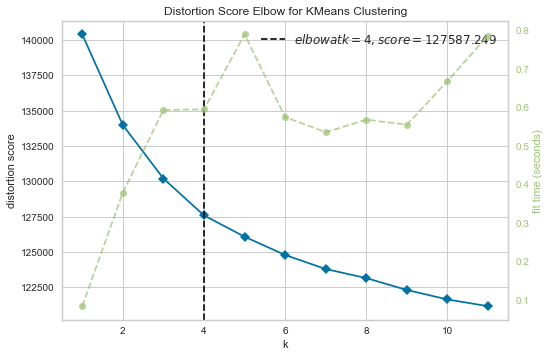

In [147]:
from yellowbrick.cluster import KElbowVisualizer
 
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12))
visualizer.fit(X_std)
visualizer.poof()

4 clusters seria o ideal

In [111]:
inertia = []
for n_clusters in range(1,10):
    kmeans = KMeans(n_clusters)
    kmeans.fit(X_std)
    inertia.append(kmeans.inertia_)

Text(0, 0.5, 'Inertia (Distortion)')

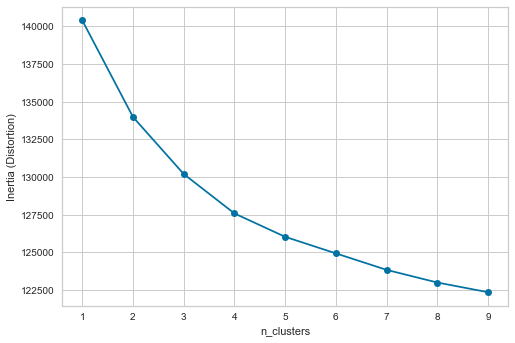

In [112]:
plt.plot(range(1,10), inertia, '-o')
plt.xlabel('n_clusters')
plt.ylabel('Inertia (Distortion)')

# PCA

In [98]:
df_scale[df_scale.columns.drop(col_cate)].head()

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,0.404572,-0.394351,-0.953457,-1.134765,-0.114996,-0.766377,-1.399480,1.318527,1.048529,-0.993575,...,0.579726,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910
1,-1.104332,0.806574,-0.953457,-1.134765,-1.047019,-1.567916,-0.605181,-0.406953,1.048529,1.195769,...,0.579726,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356
2,0.404572,2.007499,-0.953457,-0.254117,0.817027,0.836701,1.777718,-0.406953,1.048529,0.465988,...,0.579726,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356
3,0.404572,-0.394351,-0.953457,-1.134765,-1.047019,-1.567916,-1.399480,-1.269692,-1.492234,-0.993575,...,0.579726,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910
4,0.404572,-0.394351,0.759360,0.626530,-0.114996,0.836701,0.189119,1.318527,-0.645313,-0.993575,...,-0.177222,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910


In [ ]:
faz pca, plota os grupos e ve se tem alguma custerização que faça sentido 

Hue classificação do kmeans

In [190]:
X

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,labels
0,0.404572,-0.394351,-0.953457,-1.134765,-0.114996,-0.766377,-1.399480,1.318527,1.048529,-0.993575,...,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910,3
1,-1.104332,0.806574,-0.953457,-1.134765,-1.047019,-1.567916,-0.605181,-0.406953,1.048529,1.195769,...,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356,2
2,0.404572,2.007499,-0.953457,-0.254117,0.817027,0.836701,1.777718,-0.406953,1.048529,0.465988,...,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356,1
3,0.404572,-0.394351,-0.953457,-1.134765,-1.047019,-1.567916,-1.399480,-1.269692,-1.492234,-0.993575,...,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910,3
4,0.404572,-0.394351,0.759360,0.626530,-0.114996,0.836701,0.189119,1.318527,-0.645313,-0.993575,...,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,0.404572,-1.595277,1.615768,-0.254117,-0.114996,1.638241,0.983419,0.455787,0.201608,0.465988,...,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910,1
1006,-1.104332,0.806574,1.615768,-1.134765,0.817027,0.836701,-1.399480,0.455787,-2.339155,-0.993575,...,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151,0
1007,-1.104332,-0.394351,-1.809865,-1.134765,-0.114996,-0.766377,-0.605181,-0.406953,0.201608,-0.993575,...,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175,2
1008,0.404572,-0.394351,-0.097048,0.626530,-1.047019,0.035162,-1.399480,-0.406953,0.201608,-0.993575,...,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910,1


In [161]:
#X = df_scale[df_scale.columns.drop(col_cate).drop('labels')]
X = df_scale[df_scale.columns.drop(col_cate)]
#y = df_scale['labels']
#so ficar atento pq esse labels veio do 'Data Clustering with K-Means' que está depois dessa parte

pca = PCA(n_components=2)
pca.fit(X)
pca.transform(X)

#pc_n = numero de ncomponents
pc1 = pca.transform(X)[:,0]
pc2 = pca.transform(X)[:,1]



In [162]:
pca.components_[0] #eixo 

array([-4.29537294e-02,  5.74627859e-02, -3.40256645e-02, -8.53480105e-02,
       -1.83333416e-02, -6.67047881e-02, -1.47252900e-01, -8.07004803e-02,
        5.57490382e-03,  7.47287917e-02,  3.39335696e-02,  2.98300047e-02,
       -3.16124376e-04, -6.32204022e-02, -3.29015558e-02, -1.46239167e-02,
       -1.39290878e-01,  3.98858586e-02, -7.26146276e-02, -9.92363181e-03,
        9.26311727e-02,  8.83049274e-02, -2.49031098e-02, -1.88653171e-01,
        9.82339674e-02,  1.22829143e-01, -1.45002463e-01, -8.73350687e-02,
        1.10954642e-05,  9.72340219e-02,  1.33975751e-01, -1.39539646e-03,
       -8.60162368e-02,  4.35788633e-02,  5.51809653e-02,  8.22168380e-02,
        5.65488256e-02,  1.34307962e-01,  2.13402322e-02, -1.08070882e-01,
       -5.83993176e-02, -1.50573676e-01,  1.69947798e-03, -9.52674679e-02,
       -9.48238692e-02, -1.14396458e-02,  1.38975558e-01, -1.28372773e-01,
       -7.59446909e-02, -8.31881461e-02, -1.46048907e-01, -6.33369251e-02,
       -8.58973459e-02,  

In [163]:
plt.figure(figsize=(10,8))
plt.scatter(pc1, pc2, c=y, cmap='rainbow')
plt.xlabel('PC1')
plt.ylabel('PC2')

NameError: name 'y' is not defined

<Figure size 720x576 with 0 Axes>

In [188]:
#!pip install yellowbrick

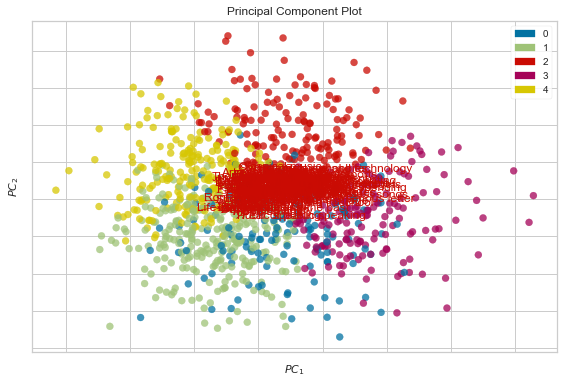

In [193]:
from yellowbrick.features import PCA

# Specify the features of interest and the target

visualizer = PCA(scale=True,proj_features = True)
visualizer.fit_transform(X, y,)
visualizer.show()

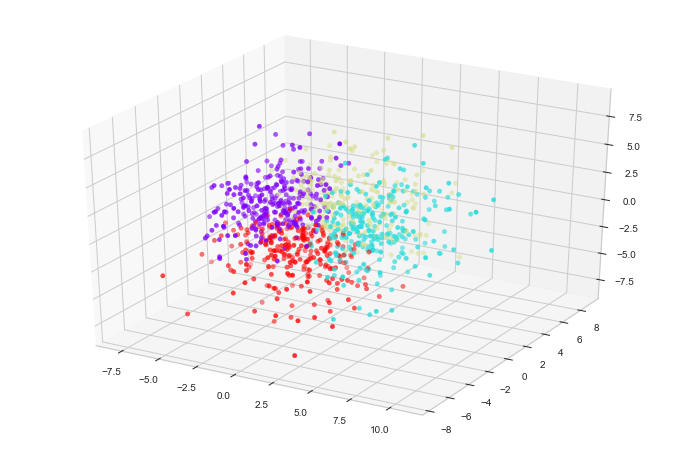

In [176]:
pca = PCA(3)
pca.fit(X_std)

pc1 = pca.transform(X_std)[:,0]
pc2 = pca.transform(X_std)[:,1]
pc3 = pca.transform(X_std)[:,2]

from mpl_toolkits.mplot3d import Axes3D

plt.figure(figsize=(12,8))
ax = plt.axes(projection='3d',)
ax.scatter3D(pc1, pc2, pc3, c=kmeans.labels_, cmap='rainbow');


In [187]:
pd.Series(kmeans.labels_).value_counts()

0    277
3    251
1    247
2    235
dtype: int64

In [191]:
df_young.groupby(by='Clusters_kmeans').mean().T

Clusters_kmeans,0,1,2,3
Music,4.872678,4.611336,4.770213,4.659218
Slow songs or fast songs,3.436823,3.506073,3.279390,3.079681
Dance,3.607316,3.121916,3.204738,2.474104
Folk,2.117607,1.824199,2.877824,2.382470
Country,1.812720,1.964562,2.592014,2.183758
Classical music,2.378745,2.437247,3.727100,3.382121
Musical,2.935018,2.026412,3.259574,2.828685
Pop,4.043321,3.236728,3.446809,3.095392
Rock,3.400895,3.595142,4.033030,4.070765
Metal or Hardrock,1.688530,2.473684,2.741964,2.637450


## Choosing number of components by pca

In [120]:
pca = PCA(.9)
pca.fit(X_std)

pca2 = PCA(.8)
pca2.fit(X_std)

PCA(copy=True, iterated_power='auto', n_components=0.8, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [121]:
print(pca.n_components_,pca2.n_components_)

97 72


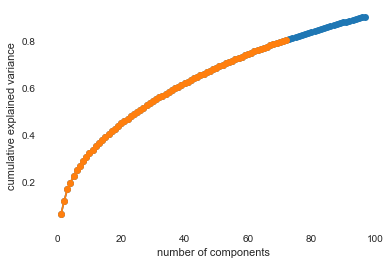

In [122]:
plt.plot(np.arange(1, pca.n_components_+1), np.cumsum(pca.explained_variance_ratio_), '-o')

plt.plot(np.arange(1, pca2.n_components_+1), np.cumsum(pca2.explained_variance_ratio_), '-o')

plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

Como podemos ver, para ter 90% de explicação precisamos de 97 componentes enquanto para explicar 80% precisamos apenas de 72

# Data Clustering with K-Means

In [171]:
kmeans = KMeans(n_clusters=4)

young_clusters = kmeans.fit(X_std)

In [172]:
#olhandos os pontos dos centrais dos clusters
young_clusters.cluster_centers_

array([[ 0.21850141,  0.1011352 ,  0.39471768, -0.15072697, -0.27427613,
        -0.42751012,  0.17800989,  0.45578705, -0.3098442 , -0.48904903,
        -0.31725611,  0.27621983, -0.09265174, -0.2644998 , -0.28310771,
        -0.35605635,  0.26614392,  0.05935961, -0.35164302,  0.14326933,
        -0.09177919, -0.1714844 ,  0.32373684,  0.59375841, -0.38528705,
        -0.49967369,  0.33076344,  0.13810974, -0.5417316 , -0.53904792,
        -0.31433841, -0.38490352, -0.03143552, -0.29676325, -0.33254327,
        -0.5494885 ,  0.11366866, -0.33912576,  0.16013904, -0.03284318,
        -0.18329875, -0.01233488, -0.2129752 ,  0.1581417 , -0.10970165,
        -0.03214609, -0.26291706, -0.082403  , -0.26841399, -0.04135225,
         0.39468472, -0.23062723, -0.14984722,  0.091252  , -0.07391047,
         0.06343482,  0.60868222,  0.79804225, -0.46297384,  0.0899372 ,
         0.28296521, -0.10918004,  0.19776984,  0.2182228 ,  0.51302607,
         0.48967481,  0.13664953,  0.47622604,  0.4

In [173]:
df_young['Clusters_kmeans']= young_clusters.fit_predict(X_std)

In [174]:
#vendo a distribuição dos clusters
df_young.Clusters_kmeans.value_counts()

0    277
3    251
1    247
2    235
Name: Clusters_kmeans, dtype: int64

In [152]:
kmeans.labels_

array([0, 1, 3, ..., 2, 0, 2])

In [153]:
predicted = kmeans.predict(X_std)

In [154]:
from sklearn.decomposition import PCA

In [155]:
pca = PCA(2)
pc = pca.fit_transform(X_std)

Text(0.5, 1.0, 'Clusters distribution')

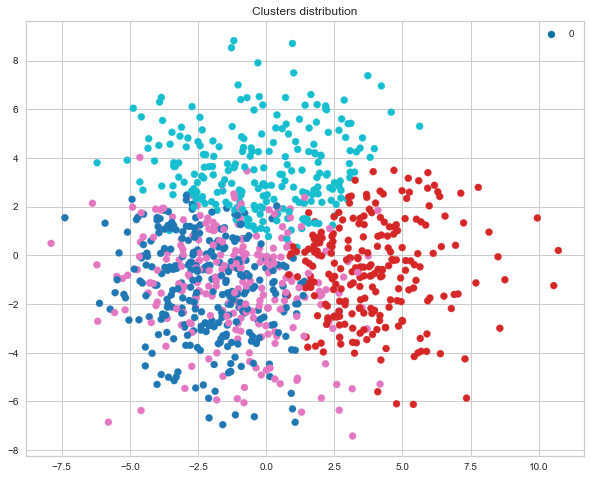

In [156]:
plt.figure(figsize=(10,8))
plt.scatter(pc[:,0], pc[:, 1], c=predicted, cmap='tab10' )
plt.legend(predicted)
plt.title('Clusters distribution')

In [249]:
pca4 = PCA(3)

pca4 = pca4.fit(X_std)

pc41 = pca4.transform(X_std)[:,0]
pc42 = pca4.transform(X_std)[:,1]
pc43 = pca4.transform(X_std)[:,2]

In [253]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()




trace = go.Scatter3d(
x = pc41,
y = pc42,
z = pc43,
mode = 'markers',
marker = {'size':5, 'opacity':0.8, 'color': kmeans.labels_, 'colorscale':'Viridis'})

layout = go.Layout(margin = {'l':0, 'r':0, 'b':0, 't':0})

data = [trace]

plot_figure = go.Figure(data = data, layout = layout)

plotly.offline.iplot(plot_figure)


In [167]:
X = df_young[df_scale.columns.drop(col_cate)]

In [168]:
X

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,4.0,5.0,3.0,3.0,1,3.0,20.0,163.0,48.0,1.0
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,4.0,1.0,4.0,2.0,5,2.0,19.0,163.0,58.0,2.0
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,4.0,1.0,4.0,3.0,4,2.0,20.0,176.0,67.0,2.0
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,4.0,3.0,3.0,4.0,4,1.0,22.0,172.0,59.0,1.0
4,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,3.0,4.0,3.0,3.0,2,4.0,20.0,170.0,59.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,5.0,4.0,3.0,4.0,3,4.0,20.0,164.0,57.0,1.0
1006,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,1.0,1.0,1.0,1.0,5,3.0,27.0,183.0,80.0,5.0
1007,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,2.0,5.0,2.0,2.0,2,5.0,18.0,173.0,75.0,0.0
1008,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,2.0,1.0,5.0,3.0,3,3.0,25.0,173.0,58.0,1.0


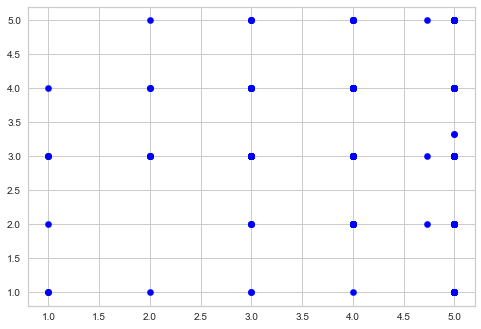

In [170]:
#o que estou fazendo errado aqui? 
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=40, c='blue')

In [170]:
X = df_scale[df_scale.columns.drop(col_cate)]
#iniate k means - cria k clusters
kmeans = KMeans()

#fitting the scaled data
kmeans.fit(X)

#data após o fit (cluster number assigned to each data record ou seja, em qual cluster cada linha ficou)
kmeans.labels_
kmeans.predict(X) #é a mesma coisa porque no caso do cluster, a previsão é dos grupos 


#nova coluna com os clusters
df_scale['labels'] = kmeans.labels_
df_scale['labels'].value_counts() #verificando a distribuição por cluster

1    276
4    225
2    185
3    175
0    149
Name: labels, dtype: int64

In [165]:
X

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,labels
0,0.404572,-0.394351,-0.953457,-1.134765,-0.114996,-0.766377,-1.399480,1.318527,1.048529,-0.993575,...,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910,6
1,-1.104332,0.806574,-0.953457,-1.134765,-1.047019,-1.567916,-0.605181,-0.406953,1.048529,1.195769,...,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356,3
2,0.404572,2.007499,-0.953457,-0.254117,0.817027,0.836701,1.777718,-0.406953,1.048529,0.465988,...,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356,2
3,0.404572,-0.394351,-0.953457,-1.134765,-1.047019,-1.567916,-1.399480,-1.269692,-1.492234,-0.993575,...,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910,7
4,0.404572,-0.394351,0.759360,0.626530,-0.114996,0.836701,0.189119,1.318527,-0.645313,-0.993575,...,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,0.404572,-1.595277,1.615768,-0.254117,-0.114996,1.638241,0.983419,0.455787,0.201608,0.465988,...,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910,1
1006,-1.104332,0.806574,1.615768,-1.134765,0.817027,0.836701,-1.399480,0.455787,-2.339155,-0.993575,...,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151,5
1007,-1.104332,-0.394351,-1.809865,-1.134765,-0.114996,-0.766377,-0.605181,-0.406953,0.201608,-0.993575,...,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175,3
1008,0.404572,-0.394351,-0.097048,0.626530,-1.047019,0.035162,-1.399480,-0.406953,0.201608,-0.993575,...,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910,1


In [166]:
kmeans.cluster_centers_[:,100]

array([-0.17880554,  0.1112104 ,  0.06482737, -0.0360348 ])

In [146]:
X

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,0.404572,-0.394351,-0.953457,-1.134765,-0.114996,-0.766377,-1.399480,1.318527,1.048529,-0.993575,...,0.579726,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910
1,-1.104332,0.806574,-0.953457,-1.134765,-1.047019,-1.567916,-0.605181,-0.406953,1.048529,1.195769,...,0.579726,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356
2,0.404572,2.007499,-0.953457,-0.254117,0.817027,0.836701,1.777718,-0.406953,1.048529,0.465988,...,0.579726,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356
3,0.404572,-0.394351,-0.953457,-1.134765,-1.047019,-1.567916,-1.399480,-1.269692,-1.492234,-0.993575,...,0.579726,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910
4,0.404572,-0.394351,0.759360,0.626530,-0.114996,0.836701,0.189119,1.318527,-0.645313,-0.993575,...,-0.177222,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,0.404572,-1.595277,1.615768,-0.254117,-0.114996,1.638241,0.983419,0.455787,0.201608,0.465988,...,1.336673,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910
1006,-1.104332,0.806574,1.615768,-1.134765,0.817027,0.836701,-1.399480,0.455787,-2.339155,-0.993575,...,-1.691117,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151
1007,-1.104332,-0.394351,-1.809865,-1.134765,-0.114996,-0.766377,-0.605181,-0.406953,0.201608,-0.993575,...,-0.934169,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175
1008,0.404572,-0.394351,-0.097048,0.626530,-1.047019,0.035162,-1.399480,-0.406953,0.201608,-0.993575,...,-0.934169,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910


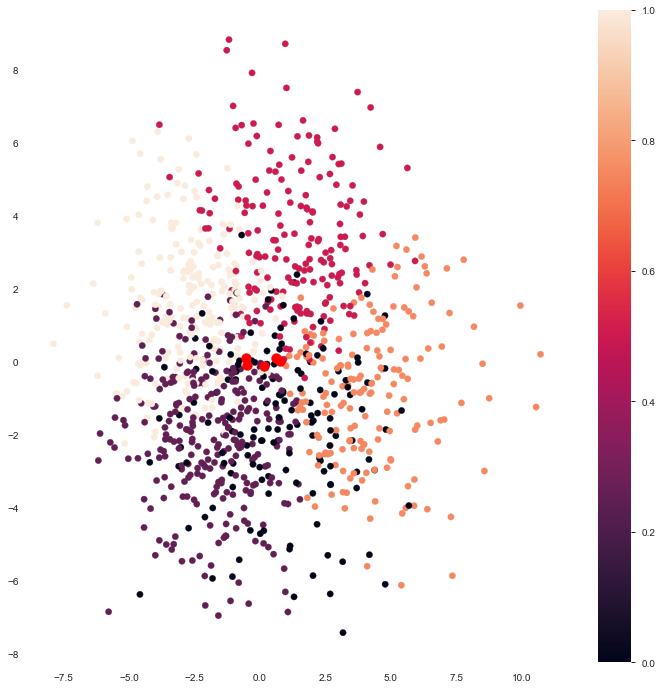

In [171]:
plt.figure(figsize=(12,12))
plt.scatter(pc1, pc2, s=40, c=df_scale['labels']);

plt.scatter(kmeans.cluster_centers_[:,137], kmeans.cluster_centers_[:,138], s=100, c='red')
plt.colorbar()
plt.show()

In [102]:
df_scale

,Smoking,Alcohol,Punctuality,Lying,Internet usage,Gender,Left - right handed,Education,Only child,Village - town,...,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings,labels
0,never smoked,drink a lot,i am always on time,never,few hours a day,female,right handed,college/bachelor degree,no,village,...,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910,6
1,never smoked,drink a lot,i am often early,sometimes,few hours a day,female,right handed,college/bachelor degree,no,city,...,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356,3
2,tried smoking,drink a lot,i am often running late,sometimes,few hours a day,female,right handed,secondary school,no,city,...,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356,2
3,former smoker,drink a lot,i am often early,only to avoid hurting someone,most of the day,female,right handed,college/bachelor degree,yes,city,...,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910,7
4,tried smoking,social drinker,i am always on time,everytime it suits me,few hours a day,female,right handed,secondary school,no,village,...,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,current smoker,drink a lot,i am often running late,everytime it suits me,few hours a day,female,right handed,secondary school,no,city,...,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910,1
1006,never smoked,social drinker,i am often early,sometimes,less than an hour a day,male,left handed,masters degree,no,village,...,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151,5
1007,tried smoking,social drinker,i am often running late,only to avoid hurting someone,most of the day,female,right handed,secondary school,yes,city,...,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175,3
1008,tried smoking,social drinker,i am often running late,sometimes,most of the day,female,right handed,college/bachelor degree,no,city,...,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910,1


# Data Clustering with DBSCAN

In [192]:
df_scale

,Smoking,Alcohol,Punctuality,Lying,Internet usage,Gender,Left - right handed,Education,Only child,Village - town,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,never smoked,drink a lot,i am always on time,never,few hours a day,female,right handed,college/bachelor degree,no,village,...,0.579726,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910
1,never smoked,drink a lot,i am often early,sometimes,few hours a day,female,right handed,college/bachelor degree,no,city,...,0.579726,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356
2,tried smoking,drink a lot,i am often running late,sometimes,few hours a day,female,right handed,secondary school,no,city,...,0.579726,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356
3,former smoker,drink a lot,i am often early,only to avoid hurting someone,most of the day,female,right handed,college/bachelor degree,yes,city,...,0.579726,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910
4,tried smoking,social drinker,i am always on time,everytime it suits me,few hours a day,female,right handed,secondary school,no,village,...,-0.177222,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,current smoker,drink a lot,i am often running late,everytime it suits me,few hours a day,female,right handed,secondary school,no,city,...,1.336673,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910
1006,never smoked,social drinker,i am often early,sometimes,less than an hour a day,male,left handed,masters degree,no,village,...,-1.691117,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151
1007,tried smoking,social drinker,i am often running late,only to avoid hurting someone,most of the day,female,right handed,secondary school,yes,city,...,-0.934169,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175
1008,tried smoking,social drinker,i am often running late,sometimes,most of the day,female,right handed,college/bachelor degree,no,city,...,-0.934169,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910


In [205]:
X1.T

,0,1,2,3,4,5,6,7,8,9,...,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009
Music,0.404572,-1.104332,0.404572,0.404572,0.404572,0.404572,0.404572,0.404572,0.404572,0.404572,...,0.404572,0.404572,0.404572,-1.104332,0.404572,0.404572,-1.104332e+00,-1.104332,0.404572,0.404572
Slow songs or fast songs,-0.394351,0.806574,2.007499,-0.394351,-0.394351,-0.394351,2.007499,-0.394351,-0.394351,-0.394351,...,-0.394351,2.007499,2.007499,-0.394351,-0.394351,-1.595277,8.065738e-01,-0.394351,-0.394351,2.007499
Dance,-0.953457,-0.953457,-0.953457,-0.953457,0.759360,-0.953457,1.615768,-0.097048,-0.097048,-0.953457,...,-0.097048,1.615768,-0.097048,0.759360,0.759360,1.615768,1.615768e+00,-1.809865,-0.097048,0.759360
Folk,-1.134765,-1.134765,-0.254117,-1.134765,0.626530,0.626530,0.626530,-0.254117,-1.134765,2.387825,...,0.626530,-1.134765,-1.134765,0.626530,-1.134765,-0.254117,-1.134765e+00,-1.134765,0.626530,0.626530
Country,-0.114996,-1.047019,0.817027,-1.047019,-0.114996,-0.114996,-1.047019,-1.047019,-1.047019,-0.114996,...,-0.114996,-0.114996,0.817027,-0.114996,-0.114996,-0.114996,8.170274e-01,-0.114996,-1.047019,-0.114996
Classical music,-0.766377,-1.567916,0.836701,-1.567916,0.836701,0.035162,-0.766377,-0.766377,-0.766377,-0.766377,...,0.035162,-1.567916,-1.567916,-0.766377,0.035162,1.638241,8.367015e-01,-0.766377,0.035162,0.035162
Musical,-1.399480,-0.605181,1.777718,-1.399480,0.189119,0.189119,-0.605181,-0.605181,0.983419,1.777718,...,0.189119,0.983419,-1.399480,0.189119,-0.605181,0.983419,-1.399480e+00,-0.605181,-1.399480,0.189119
Pop,1.318527,-0.406953,-0.406953,-1.269692,1.318527,-1.269692,1.318527,0.455787,-0.406953,-0.406953,...,0.455787,0.455787,-1.269692,0.455787,-0.406953,0.455787,4.557871e-01,-0.406953,-0.406953,0.455787
Rock,1.048529,1.048529,1.048529,-1.492234,-0.645313,1.048529,-0.645313,1.048529,1.048529,1.048529,...,-0.645313,-0.645313,1.048529,1.048529,-0.645313,0.201608,-2.339155e+00,0.201608,0.201608,-2.339155
Metal or Hardrock,-0.993575,1.195769,0.465988,-0.993575,-0.993575,1.925551,-0.993575,-0.993575,1.925551,-0.263794,...,-0.993575,-0.263794,1.925551,-0.263794,1.195769,0.465988,-9.935754e-01,-0.993575,-0.993575,-0.993575


In [202]:

#X1 = df_scale[df_scale.columns.drop(col_cate).drop('labels')]
X1 = df_scale[df_scale.columns.drop(col_cate)]

#eps é a distancia dos dados entre eles na hora de agrupar, até no máximo '0.5' distancia
# min_samples = número mínimo de samples por categoria
db = DBSCAN(eps=11, min_samples=3) 

db.fit(X1)

labels = db.fit_predict(X1)

#-1 outlier, resto é categoria

#verificar quantos ficaram em cada categoria
pd.Series(labels).value_counts()

-1    849
 0    155
 1      3
 2      3
dtype: int64

In [204]:
pca.explained_variance_ratio_

array([0.06484045, 0.05607553, 0.049471  ])

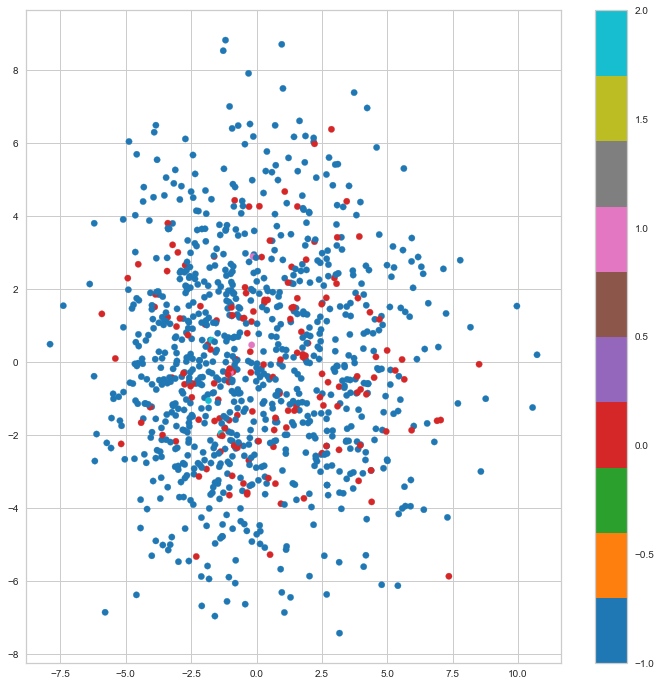

In [203]:
plt.figure(figsize=(12,12))
plt.scatter(pc1, pc2, s=40, c=labels,cmap='tab10');

plt.colorbar()
plt.show()

In [213]:
X2 = X1.loc[:,'Slow songs or fast songs':'Techno, Trance']
#X2

In [226]:
# min_samples = número mínimo de samples por categoria
db = DBSCAN(eps=3, min_samples=3) 

db.fit(X2)

labels2 = db.fit_predict(X2)

#-1 outlier, resto é categoria

#verificar quantos ficaram em cada categoria
pd.Series(labels).value_counts()

 0    758
-1    243
 3      3
 2      3
 1      3
dtype: int64

In [236]:
pca2 =PCA(2)

pca2.fit(X2)

pca1_2 = pca2.transform(X2)[:,0]
pca2_2 = pca2.transform(X2)[:,1]

In [237]:
pca2.explained_variance_ratio_

array([0.20898746, 0.15308434])

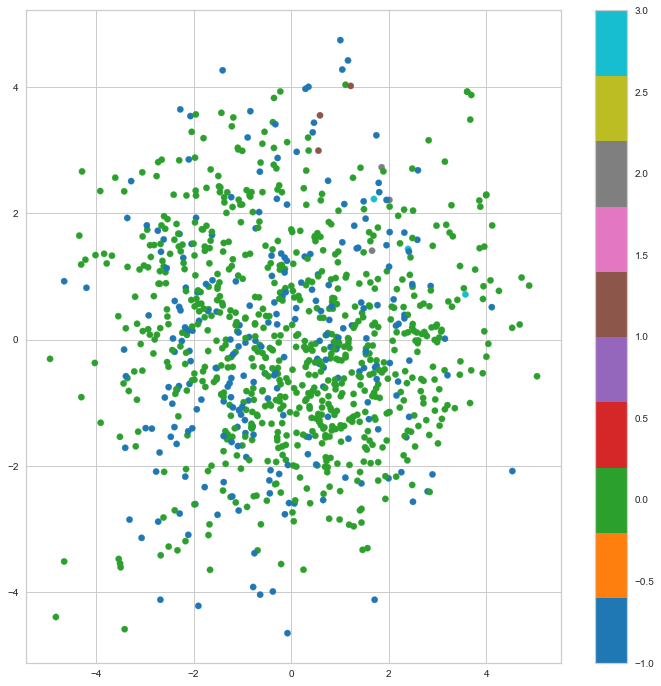

In [238]:
plt.figure(figsize=(12,12))
plt.scatter(pca1_2, pca2_2, s=40, c=labels2,cmap='tab10');

plt.colorbar()
plt.show()

In [239]:
pca3 =PCA(3)

pca3.fit(X2)

pca1_3 = pca3.transform(X2)[:,0]
pca2_3 = pca3.transform(X2)[:,1]
pca3_3 = pca3.transform(X2)[:,2]

In [243]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

trace = go.Scatter3d(
x = pca1_3,
y = pca2_3,
z = pca3_3,
mode = 'markers',
marker = {'size':5, 'opacity':0.8, 'color': labels2, 'colorscale':'Hot'})

layout = go.Layout(margin = {'l':0, 'r':0, 'b':0, 't':0})

data = [trace]

plot_figure = go.Figure(data = data, layout = layout)

plotly.offline.iplot(plot_figure)


# Hierarquia

In [95]:
from sklearn.cluster import AgglomerativeClustering

In [101]:
df_scale.columns.drop(col_cate).drop('labels')
df_scale.drop(col_cate,axis =1)

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
0,0.404572,-0.394351,-0.953457,-1.134765,-0.114996,-0.766377,-1.399480,1.318527,1.048529,-0.993575,...,0.579726,1.494507,-0.169889,-0.088328,-1.456239,-0.510509,-0.153924,-1.059921,-1.343932,-0.294910
1,-1.104332,0.806574,-0.953457,-1.134765,-1.047019,-1.567916,-0.605181,-0.406953,1.048529,1.195769,...,0.579726,-1.572085,0.672861,-0.919597,1.658216,-1.426156,-0.508834,-1.059921,-0.613735,0.695356
2,0.404572,2.007499,-0.953457,-0.254117,0.817027,0.836701,1.777718,-0.406953,1.048529,0.465988,...,0.579726,-1.572085,0.672861,-0.088328,0.879602,-1.426156,-0.153924,0.250597,0.043443,0.695356
3,0.404572,-0.394351,-0.953457,-1.134765,-1.047019,-1.567916,-1.399480,-1.269692,-1.492234,-0.993575,...,0.579726,-0.038789,-0.169889,0.742942,0.879602,-2.341803,0.555896,-0.152639,-0.540715,-0.294910
4,0.404572,-0.394351,0.759360,0.626530,-0.114996,0.836701,0.189119,1.318527,-0.645313,-0.993575,...,-0.177222,0.727859,-0.169889,-0.088328,-0.677625,0.405137,-0.153924,-0.354257,-0.540715,-0.294910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,0.404572,-1.595277,1.615768,-0.254117,-0.114996,1.638241,0.983419,0.455787,0.201608,0.465988,...,1.336673,0.727859,-0.169889,0.742942,0.100989,0.405137,-0.153924,-0.959112,-0.686754,-0.294910
1006,-1.104332,0.806574,1.615768,-1.134765,0.817027,0.836701,-1.399480,0.455787,-2.339155,-0.993575,...,-1.691117,-1.572085,-1.855390,-1.750867,1.658216,-0.510509,2.330447,0.956261,0.992700,3.666151
1007,-1.104332,-0.394351,-1.809865,-1.134765,-0.114996,-0.766377,-0.605181,-0.406953,0.201608,-0.993575,...,-0.934169,1.494507,-1.012640,-0.919597,-0.677625,1.320784,-0.863744,-0.051830,0.627601,-1.285175
1008,0.404572,-0.394351,-0.097048,0.626530,-1.047019,0.035162,-1.399480,-0.406953,0.201608,-0.993575,...,-0.934169,-1.572085,1.515612,-0.088328,0.100989,-0.510509,1.620627,-0.051830,-0.613735,-0.294910


In [102]:
#nao rodei essa parte, mas caso rode
#df_young_sample = df_scale[df_scale.columns.drop(col_cate).drop('labels')].sample(n=100)

df_young_sample = df_scale[df_scale.columns.drop(col_cate)].sample(n=100)
hier_clust = AgglomerativeClustering(linkage='ward')
young_hier = hier_clust.fit(df_young_sample)


In [103]:
from scipy.cluster.hierarchy import dendrogram
import matplotlib.pyplot as plt
 
def plot_dendrogram(model, **kwargs):
    # Children of hierarchical clustering
    children = model.children_
    # Distances between each pair of children
    # Since we don't have this information, we can use a uniform one for plotting
    distance = np.arange(children.shape[0])
    # The number of observations contained in each cluster level
    no_of_observations = np.arange(2, children.shape[0]+2)
    # Create linkage matrix and then plot the dendrogram
    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(float)
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

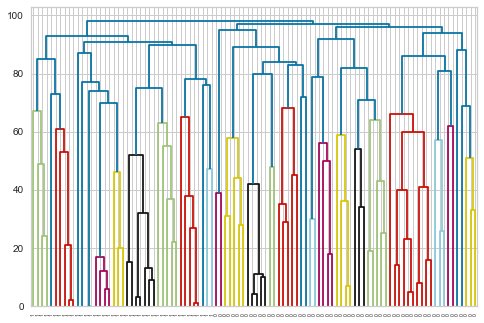

In [105]:
plot_dendrogram(young_hier, labels=young_hier.labels_)

## Method ward

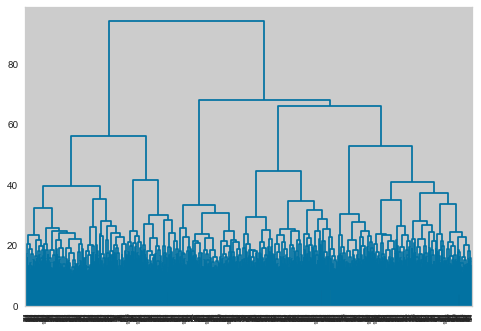

In [107]:
dendrogram = hierarchy.dendrogram(
    hierarchy.linkage(X_std, method = 'ward'), color_threshold=6
)

In [108]:
dendrogram = hierarchy.dendrogram(
    hierarchy.linkage(StandardScaler().fit_transform(X), method = 'ward'), color_threshold=6
)

NameError: name 'X' is not defined

## method Complete

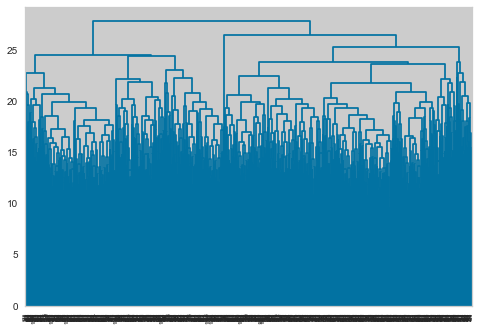

In [122]:
dendrogram = hierarchy.dendrogram(
    hierarchy.linkage(X_std, method = 'complete'), color_threshold=3
)

## method ward

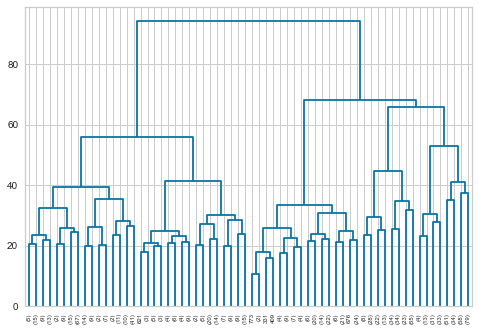

In [123]:
dendrogram = hierarchy.dendrogram(hierarchy.linkage(X_std, method = 'ward'), color_threshold=0.4, truncate_mode='level', p=5 )

In [124]:
hierarchical = AgglomerativeClustering(n_clusters=5)
hierarchical.fit(X_std)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=5)

In [125]:
plt.scatter(X_std.iloc[:, 0], X_std.iloc[:, 1], c=hierarchical.labels_, cmap='tab10')
plt.xlabel(X_std.columns[0])
plt.ylabel(X_std.columns[1])
plt.colorbar();

AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

# TSNE

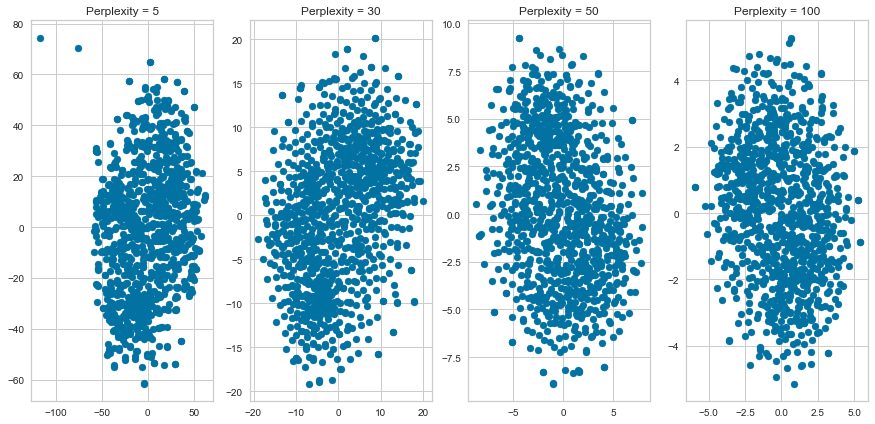

In [128]:
from sklearn.manifold import TSNE
 
#X, y = datasets.load_iris(return_X_y=True)
 
fig, ax = plt.subplots(1, 4, figsize=(15, 7))
for i, perp in enumerate([5, 30, 50, 100]):
    tsne = TSNE(perplexity=perp)
    x_embedded = tsne.fit_transform(X_std)
    ax[i].scatter(x_embedded[:, 0], x_embedded[:, 1])#, c=y)
    ax[i].set_title("Perplexity = {}".format(perp))
    
plt.show()

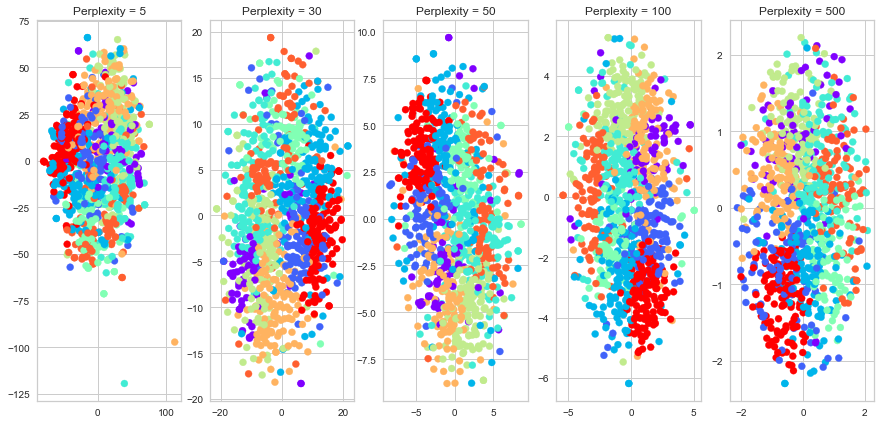

In [141]:
from sklearn.manifold import TSNE
 
#X, y = datasets.load_iris(return_X_y=True)
 
fig, ax = plt.subplots(1, 5, figsize=(15, 7))
for i, perp in enumerate([5, 30, 50, 100,500]):
    tsne = TSNE(perplexity=perp)
    x_embedded = tsne.fit_transform(X_std)
    ax[i].scatter(x_embedded[:, 0], x_embedded[:, 1], c=df_young['Clusters_kmeans'],cmap='rainbow')
    ax[i].set_title("Perplexity = {}".format(perp))
    
plt.show()

In [244]:
from sklearn.manifold import TSNE
 
#X, y = datasets.load_iris(return_X_y=True)
 
fig, ax = plt.subplots(1, 5, figsize=(15, 7))
for i, perp in enumerate([5, 30, 50, 100]):
    tsne = TSNE(perplexity=perp)
    x_embedded = tsne.fit_transform(X)
    ax[i].scatter(x_embedded[:, 0], x_embedded[:, 1], c=df_young['Clusters_kmeans'],cmap='rainbow')
    ax[i].set_title("Perplexity = {}".format(perp))
    
plt.show()

KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x000001DC40403318> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001DC404EDC18> (for post_execute):



KeyboardInterrupt



In [245]:
kmeans.labels_

array([0, 1, 2, ..., 3, 0, 3])

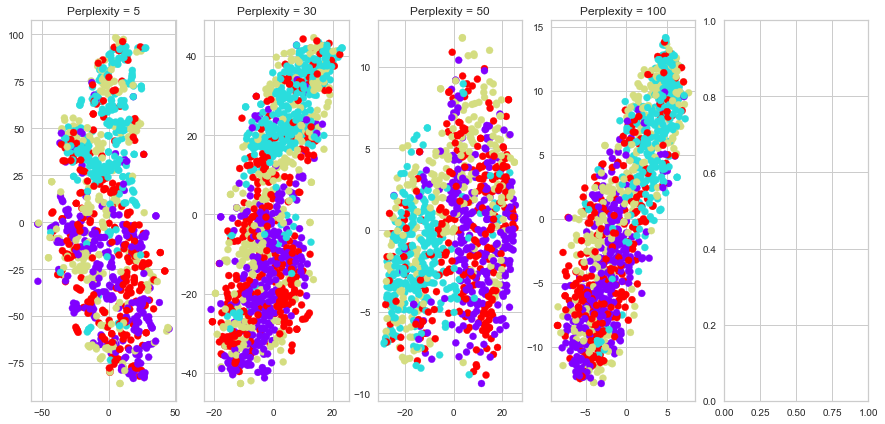

In [246]:
from sklearn.manifold import TSNE
 
#X, y = datasets.load_iris(return_X_y=True)
 
fig, ax = plt.subplots(1, 5, figsize=(15, 7))
for i, perp in enumerate([5, 30, 50, 100]):
    tsne = TSNE(perplexity=perp)
    x_embedded = tsne.fit_transform(X)
    ax[i].scatter(x_embedded[:, 0], x_embedded[:, 1], c=kmeans.labels_,cmap='rainbow')
    ax[i].set_title("Perplexity = {}".format(perp))
    
plt.show()